In [78]:
from diffusers import AutoencoderKL, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer, logging
from diffusers import LMSDiscreteScheduler
import torch
from torchvision import transforms as tfms

import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from pathlib import Path
from huggingface_hub import notebook_login
import os
from PIL import Image
import numpy as np

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device: os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

In [3]:
# download tokenizer and text encoder
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
print(f"{tokenizer.vocab_size} tokens, maximum sequence length {tokenizer.model_max_length}")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

# Here we use a different VAE to the original release, which has been fine-tuned for more steps
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to("cuda")
# We use a original Unet for stable diffusion   
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")

# scheduler 
beta_start,beta_end = 0.00085,0.012
scheduler = LMSDiscreteScheduler(beta_start=beta_start, beta_end=beta_end, beta_schedule="scaled_linear", num_train_timesteps=1000)

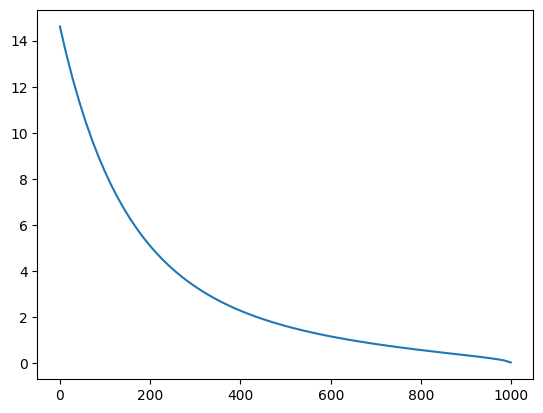

In [243]:
# plot sigma schedule
plt.plot(scheduler.timesteps.numpy()[::-1], scheduler.sigmas[:-1])

In [27]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [64]:
height = 512
width = 512
num_inference_steps = 70
guidance_scale = 7.5
batch_size = 1

In [170]:


# text 

def text_enc(prompts, maxlen=None):
    if maxlen is None: maxlen = tokenizer.model_max_length
    inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt")
    return text_encoder(inp.input_ids.to("cuda"))[0].half()

# sample latents from gaussian
def gaussian_latent(no_latents=1):
    latents = torch.randn((no_latents, unet.config.in_channels, height//8, width//8))
    latents = latents.to("cuda").half() * scheduler.init_noise_sigma
    return latents


In [264]:
# run diffusion
def run_stdi(prompts, g, scheduler, num_inference_steps, plot_spet=None, pred_noise=None):
    bs = len(prompts)
    # set up scheduler
    scheduler.set_timesteps(num_inference_steps)
    # get text embedding
    text_emb = text_enc(prompts)
    # get unconditional text embedding
    uncond_emb = text_enc([""] * bs, maxlen=text_emb.shape[1])
    emb = torch.cat([uncond_emb, text_emb])
    # get gaussian latents
    latents = gaussian_latent(len(prompts))

    latents = latents.to("cuda").half()
    emb = emb.to("cuda").half()
    for i, ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
        if pred_noise is not None:
            pred = pred_noise(t, u, g, ts)
        else:
            pred = u + g*(t-u)
        latents = scheduler.step(pred, ts, latents).prev_sample
        if plot_spet is not None:
            plot_spet(i, pred, t, u, latents)
    return latents

In [260]:
# start with gaussian noise
torch.manual_seed(100)
g = guidance_scale

prompts = [
    'a photograph of an astronaut riding a horse',
    # 'an oil painting of an astronaut riding a horse in the style of grant wood'
]

latents = run_stdi(prompts, g, scheduler, num_inference_steps)

  0%|          | 0/71 [00:00<?, ?it/s]

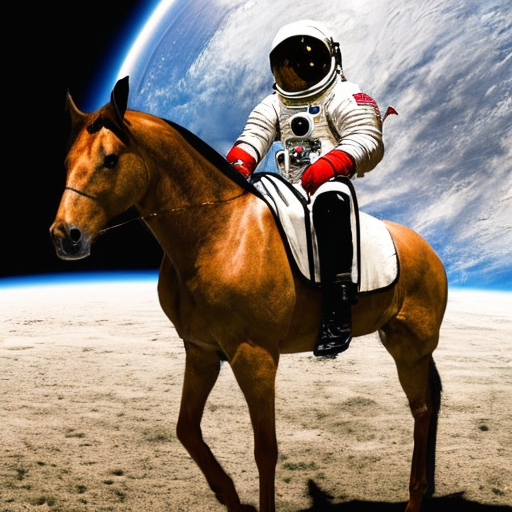

In [208]:
latents_to_pil(latents)[0]

  0%|          | 0/71 [00:00<?, ?it/s]

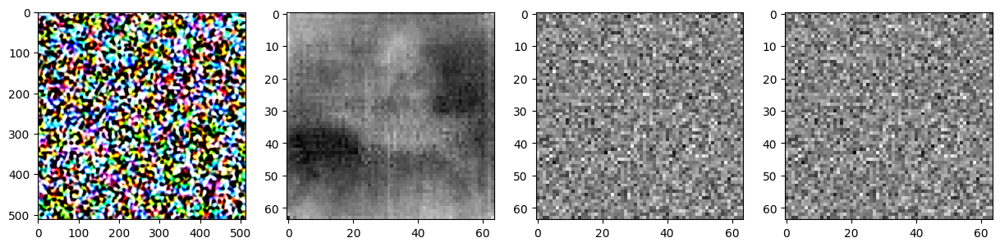

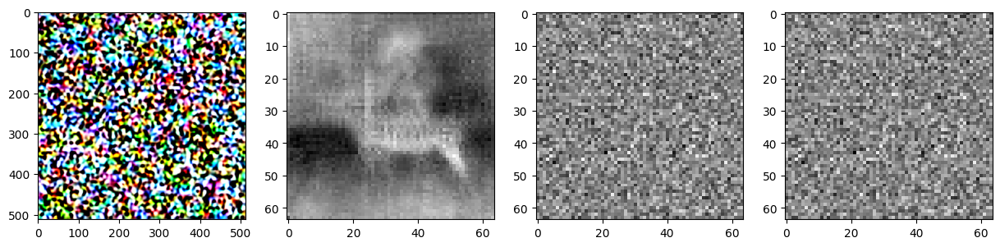

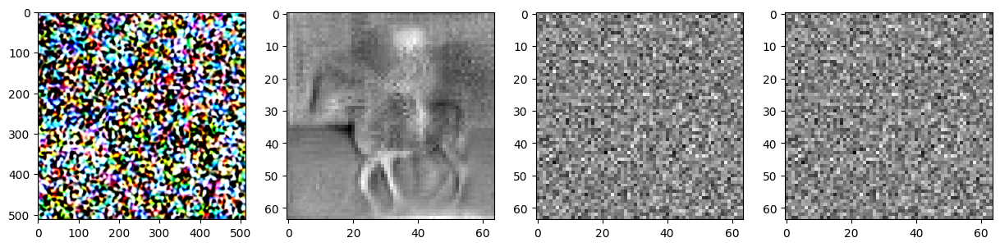

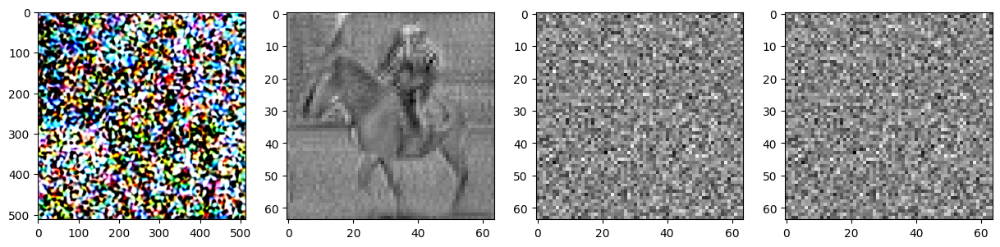

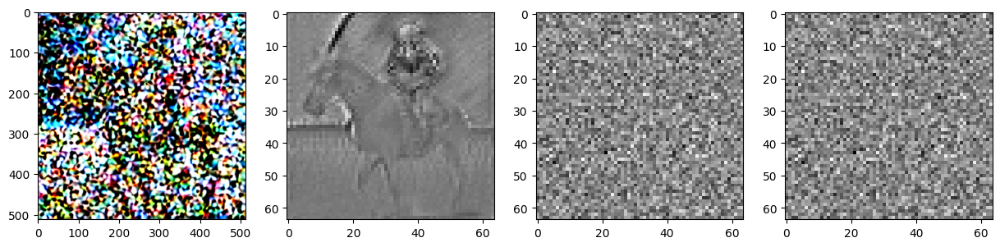

...

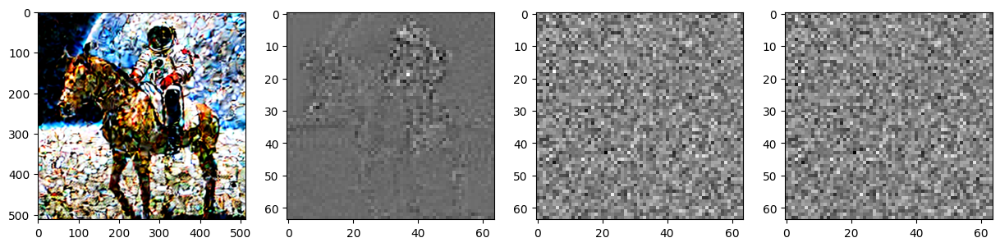

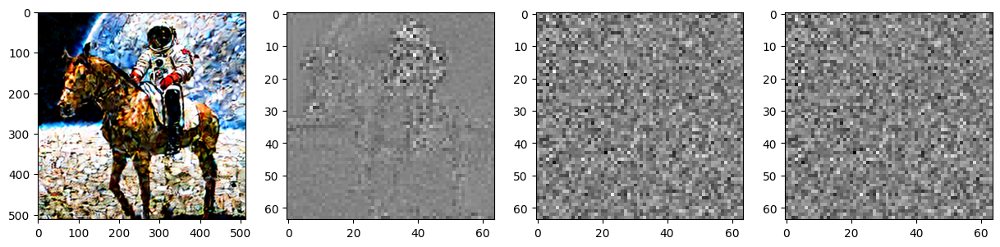

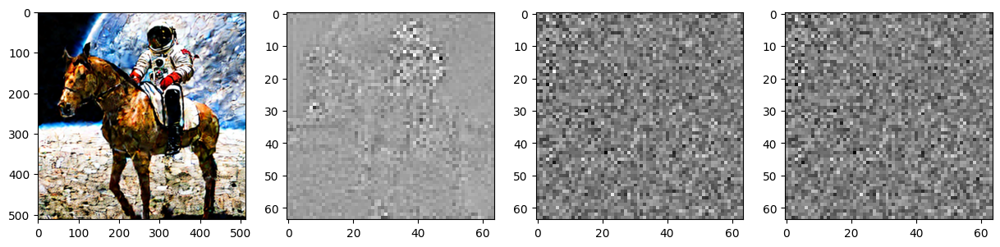

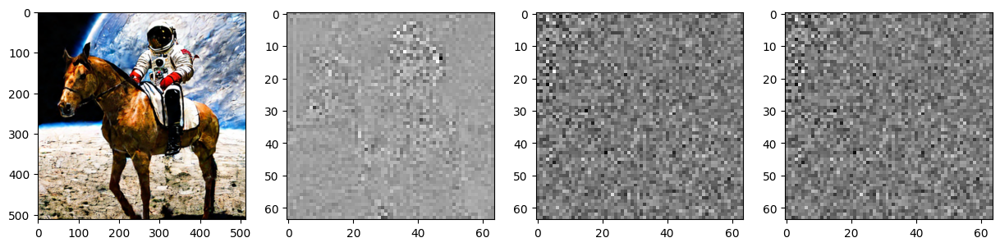

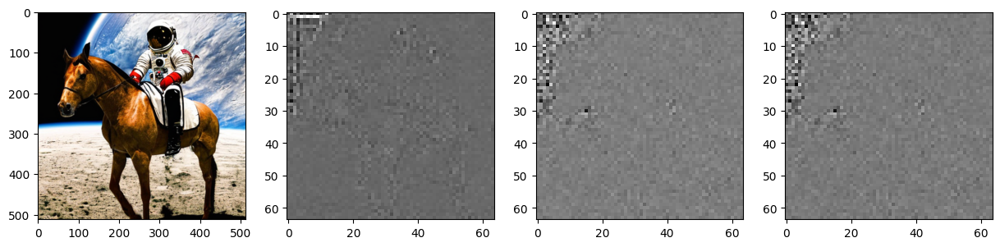

In [262]:
import time

def pred_noise(t, u, g, ts):
    nonscale_pred = u + g*(t-u)
    pred = nonscale_pred * torch.norm(u)/torch.norm(nonscale_pred)
    return pred

def plot_step(i, pred, t, u, latents):
    
    if i % 5 == 0:
        plt.figure(figsize=(15, 5))
        plt.subplot(1,4,1)
        plt.imshow(latents_to_pil(latents)[0])
        plt.subplot(1,4,2)
        plt.imshow((t-u)[0].sum(dim=0).cpu().numpy(), cmap='gray', label='diff')
        # plt.imshow(latents_to_pil(pred)[0])
        plt.subplot(1,4,3)
        plt.imshow(u[0].sum(dim=0).cpu().numpy(), cmap='gray', label='u')
        plt.subplot(1,4,4)
        plt.imshow(t[0].sum(dim=0).cpu().numpy(), cmap='gray', label='t')
        plt.show()
        
# start with gaussian noise
torch.manual_seed(100)
g = 7.5
num_inference_steps = 71

prompts = [
    'a photograph of an astronaut riding a horse',
    # 'an oil painting of an astronaut riding a horse in the style of grant wood'
]

latent_v1 = run_stdi(prompts, g, scheduler, num_inference_steps, plot_step, pred_noise)

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

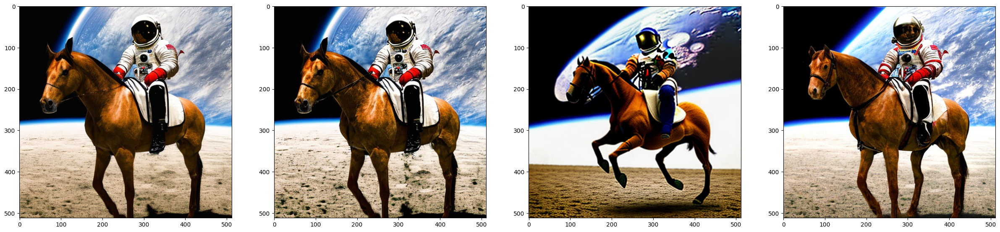

In [265]:
def pred_noise(t, u, g, ts):
    pred = u + g*(t-u)
    return pred

def pred_noise_v1(t, u, g, ts):
    nonscale_pred = u + g*(t-u)
    pred = nonscale_pred * torch.norm(u)/torch.norm(nonscale_pred)
    return pred

def pred_noise_v21(t, u, g, ts):
    pred = u + g*(t-u)/torch.norm(t-u)*torch.norm(u)
    return pred


def pred_noise_v22(t, u, g, ts):
    nonscsled_pred = u + g*(t-u)/torch.norm(t-u)*torch.norm(u)
    pred = nonscsled_pred * torch.norm(u)/torch.norm(nonscsled_pred)
    return pred

latents = []
pred_func = [pred_noise, pred_noise_v1, pred_noise_v21, pred_noise_v22]
gs = [7.5, 7.5, 0.5, .1]

for g, pred in zip(gs, pred_func):
    # start with gaussian noise
    torch.manual_seed(100)
    latents.append(run_stdi(prompts, g, scheduler, num_inference_steps, None, pred))

# plot all together
plt.figure(figsize=(30, 10))
for i, let in enumerate(latents):
    plt.subplot(1,4,i+1)
    plt.imshow(latents_to_pil(let)[0])

/tmp/ipykernel_8226/3336286756.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.plot(t, g * (torch.cos_(torch.tensor(t/999 * np.pi))+1)/2)


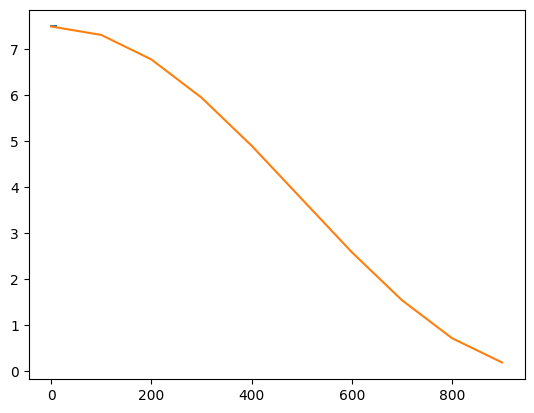

In [282]:
g = 7.5
t = torch.arange(0, 999, 100)
plt.plot([g]*len(t))
plt.plot(t, g * (torch.cos_(torch.tensor(t/999 * np.pi))+1)/2)

  0%|          | 0/101 [00:00<?, ?it/s]

/tmp/ipykernel_8226/618205724.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2


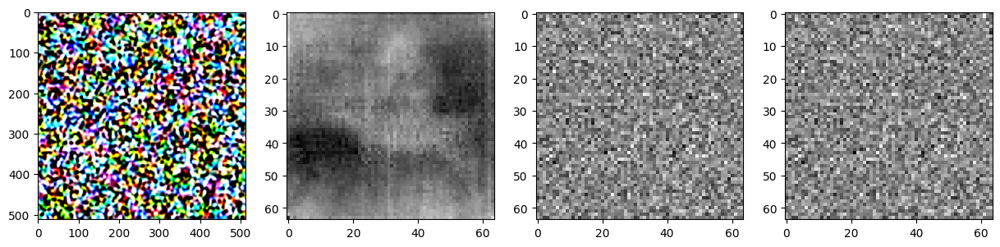

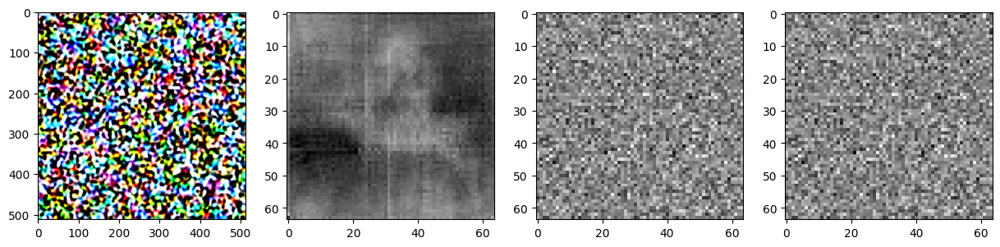

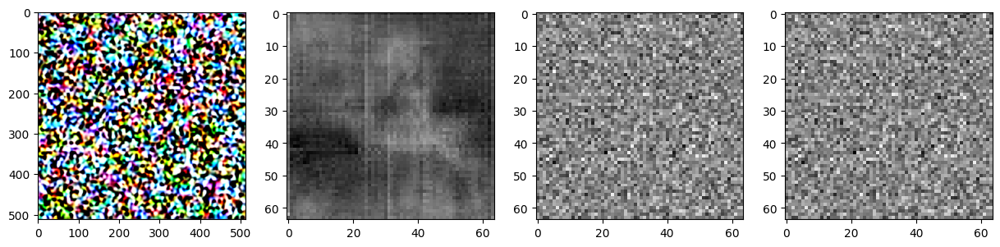

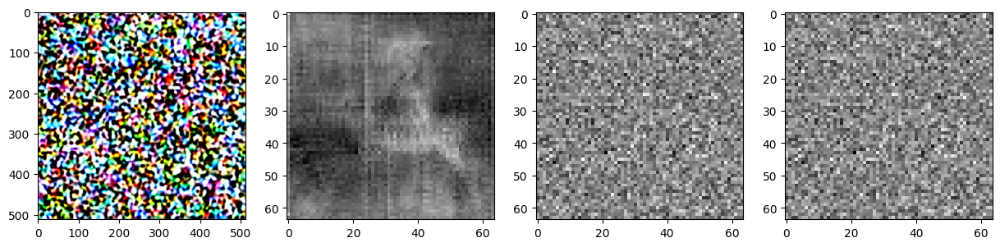

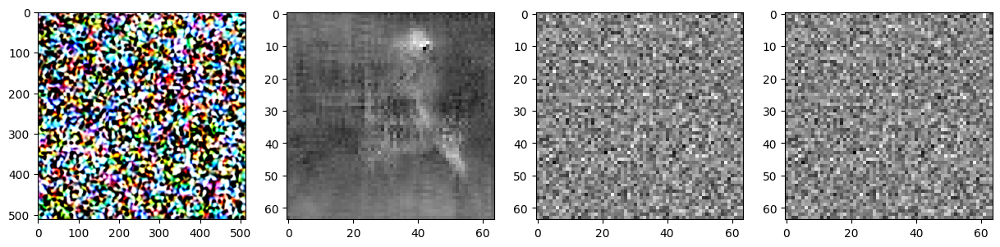

...

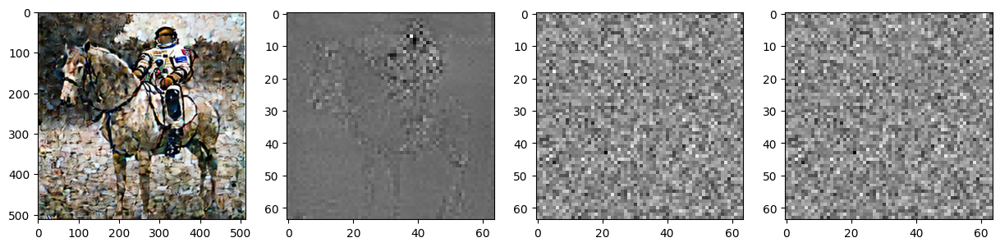

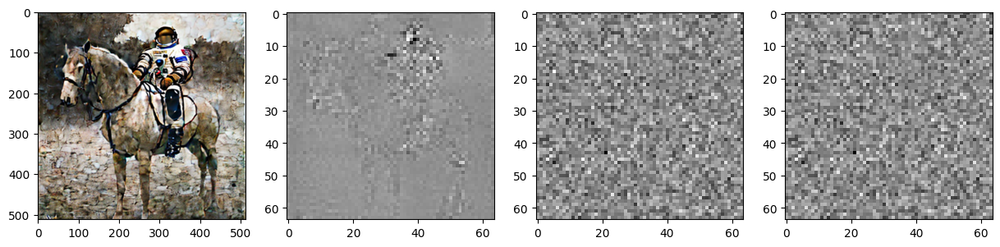

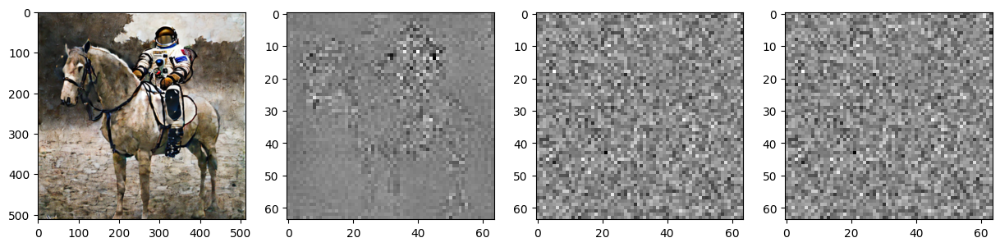

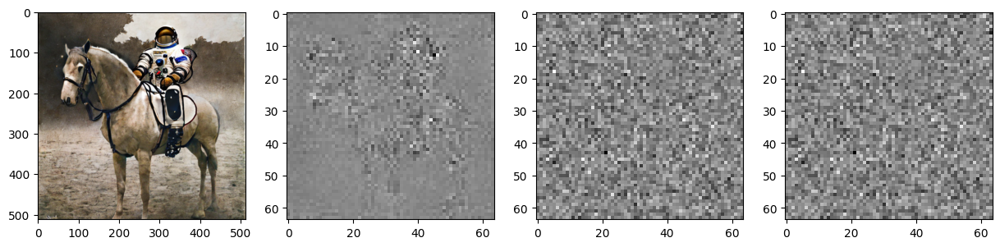

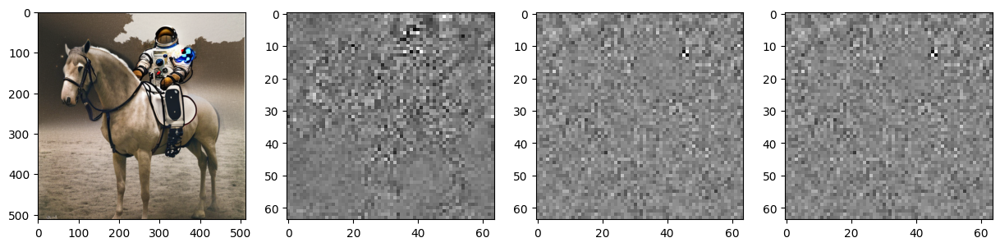

In [285]:
import time

def pred_noise(t, u, g, ts):
    # scle g using cosine 
    g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2
    pred = u + g*(t-u)/torch.norm(t-u)*torch.norm(u)
    return pred

def plot_step(i, pred, t, u, latents):
    
    if i % 5 == 0:
        plt.figure(figsize=(15, 5))
        plt.subplot(1,4,1)
        plt.imshow(latents_to_pil(latents)[0])
        plt.subplot(1,4,2)
        plt.imshow((t-u)[0].sum(dim=0).cpu().numpy(), cmap='gray', label='diff')
        # plt.imshow(latents_to_pil(pred)[0])
        plt.subplot(1,4,3)
        plt.imshow(u[0].sum(dim=0).cpu().numpy(), cmap='gray', label='u')
        plt.subplot(1,4,4)
        plt.imshow(t[0].sum(dim=0).cpu().numpy(), cmap='gray', label='t')
        plt.show()
        
# start with gaussian noise
torch.manual_seed(100)
g = 0.5
num_inference_steps = 101

prompts = [
    'a photograph of an astronaut riding a horse',
    # 'an oil painting of an astronaut riding a horse in the style of grant wood'
]

latent_v21 = run_stdi(prompts, g, scheduler, num_inference_steps, plot_step, pred_noise)

  0%|          | 0/71 [00:00<?, ?it/s]

/tmp/ipykernel_8226/382463433.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2


  0%|          | 0/71 [00:00<?, ?it/s]

/tmp/ipykernel_8226/382463433.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2


  0%|          | 0/71 [00:00<?, ?it/s]

/tmp/ipykernel_8226/382463433.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2


  0%|          | 0/71 [00:00<?, ?it/s]

/tmp/ipykernel_8226/382463433.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2


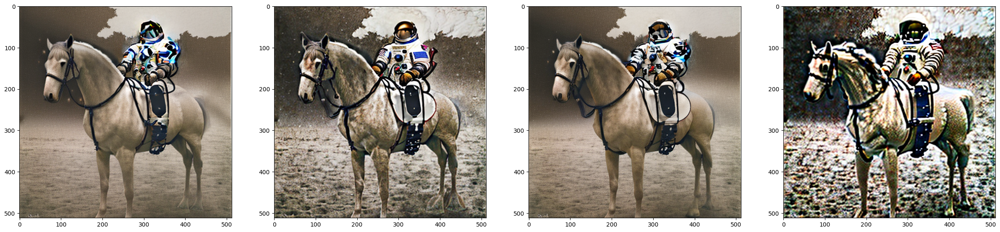

In [296]:
# scle g using cosine 
    
def pred_noise(t, u, g, ts):
    g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2
    pred = u + g*(t-u)
    return pred

def pred_noise_v1(t, u, g, ts):
    g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2
    nonscale_pred = u + g*(t-u)
    pred = nonscale_pred * torch.norm(u)/torch.norm(nonscale_pred)
    return pred

def pred_noise_v21(t, u, g, ts):
    g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2
    pred = u + g*(t-u)/torch.norm(t-u)*torch.norm(u)
    return pred


def pred_noise_v22(t, u, g, ts):
    g = g * (torch.cos(torch.tensor(ts/999 * np.pi))+1)/2
    nonscsled_pred = u + g*(t-u)/torch.norm(t-u)*torch.norm(u)
    pred = nonscsled_pred * torch.norm(u)/torch.norm(nonscsled_pred)
    return pred

latents = []
pred_func = [pred_noise, pred_noise_v1, pred_noise_v21, pred_noise_v22]
gs = [25, 25, 0.5, 1]
num_inference_steps = 71

for g, pred in zip(gs, pred_func):
    # start with gaussian noise
    torch.manual_seed(100)
    latents.append(run_stdi(prompts, g, scheduler, num_inference_steps, None, pred))

# plot all together
plt.figure(figsize=(30, 10))
for i, let in enumerate(latents):
    plt.subplot(1,4,i+1)
    plt.imshow(latents_to_pil(let)[0])